# Data Preparation

In [1]:
import requests
import pandas as pd
from datetime import datetime
import csv
from matplotlib import pyplot as plt
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np

## Data Acquisition and Understanding

### Goal:
Basically, the project is to segment the most similar subreddit to a user based on the similarity of the post that user is interacting with (may including upvotes and comments). Analyse and understand the data, perform EDA to ensure data collected is reliable for effective decision making.
1. <b>Text Processing</b> - We cannot do any meaningful EDA before text processing. So, by briefly removing obvious noises and preparing for a cleaner unstructured corpus, we can gain useful insights that might give an idea to improve the preprocessing.
2. <b>EDA</b> - Able to expose the data in terms of anomalies. Assess and validate our assumptions that is claim to be related to the subreddit themes.

In [2]:
pd.set_option("display.max_columns", None)
submission_df = pd.read_csv('submissions.csv')
submission_df.head()

,id,kind,category,created_utc,author,name,subreddit_id,subreddit_subscriber,subreddit,title,selftext,upvote_ratio,url,num_comments,ups,downs,total_awards_received,score,created,num_crossposts
0,slzdzs,t3,NaN,1.644162e+09,Independent_Bee_4468,t3_slzdzs,t5_2qs0k,51514,Home,What is this mud-like lump that recently appea...,NaN,0.50,https://www.reddit.com/gallery/slzdzs,28,0,0,0,0,1.644162e+09,0
1,qrti73,t3,NaN,1.636660e+09,TopSpite9394,t3_qrti73,t5_2qs0k,51514,Home,Any idea what this is? Sorry if this is a dumb...,NaN,0.60,https://www.reddit.com/gallery/qrti73,24,15,0,0,15,1.636660e+09,0
2,p1se4g,t3,NaN,1.628612e+09,villanegg,t3_p1se4g,t5_2qs0k,51514,Home,I just bought my first flat. First pic!,NaN,0.53,https://i.redd.it/ygtww9pv1kg71.jpg,6,1,0,0,1,1.628612e+09,0
3,oeiaps,t3,NaN,1.625525e+09,Cristheideaman,t3_oeiaps,t5_2qs0k,51514,Home,Exterior project my family completed follow on...,NaN,0.50,https://v.redd.it/sd1smhg84h971,0,0,0,0,0,1.625525e+09,0
4,nadi4r,t3,NaN,1.620784e+09,Nahughes121989,t3_nadi4r,t5_2qs0k,51514,Home,Loving my new living room setup. Just need a p...,NaN,0.59,https://i.redd.it/gt880tx8hly61.jpg,11,6,0,0,6,1.620784e+09,0


In [3]:
submission_df = submission_df.dropna(subset=['title'])
submission_df['selftext'].fillna(" ", inplace=True)
submission_df['transcript'] = submission_df['title'] + submission_df['selftext'] 
group_submission = submission_df[['subreddit', 'transcript']].groupby('subreddit')
submission_corpus = group_submission['transcript'].apply(lambda txt: " ".join(txt)).reset_index()
submission_corpus.head()

,subreddit,transcript
0,2007scape,I was trying to record this potential scammer ...
1,3Dprinting,Official Response from Cults regarding the u/B...
2,AmItheAsshole,AITA for having my 18 year old daughter pay fo...
3,AskMen,What is your experience with quiet girls?I (32...
4,AskReddit,Would you refrain from masturbation or sex for...


In [4]:
comments_df = pd.read_csv('comments_.csv')
comments_df.head()

,author,body,created_utc,id,parent_id,subreddit,subreddit_id,score
0,LT-COL-Obvious,"Don’t shoot a BB gun at it, you’ll shoot your ...",1642012439,hsdpqpx,t3_s29o71,Home,t5_2qs0k,1
1,turkeyburpin,"1. Others are correct, check into your insulat...",1642011979,hsdohyq,t3_s29o71,Home,t5_2qs0k,1
2,c0ncept,These ripped an entire gutter off my old house...,1642011771,hsdnxhb,t3_s29o71,Home,t5_2qs0k,1
3,Jared944,Glue. Lots of glue. Glue it tight; glue it right.,1642011753,hsdnvrn,t3_s1uyss,Home,t5_2qs0k,1
4,PirateINDUSTRY,Nothing like doing sub-zero roofing work on yo...,1642010983,hsdlsv2,t1_hsdcpvs,Home,t5_2qs0k,1


In [5]:
comments_df = comments_df.dropna(subset=['body'])
group_comments = comments_df[['subreddit', 'body']].groupby('subreddit')
comment_corpus = group_comments['body'].apply(lambda txt: " ".join(txt)).reset_index()
comment_corpus.head()

,subreddit,body
0,2007scape,Nice This is basically FFXIV Luv u Boobie Bras...
1,3Dprinting,1. My bed is leveled properly i think. \n2. As...
2,AmItheAsshole,"NTA. You need to drop that girl ASAP, you just..."
3,AskMen,Everyone is a mess in highschool. At least you...
4,AskReddit,"Honestly, at that age, go out, make mistakes. ..."


## Text Processing

#### Merge both submission and comment transcript by subreddit

In [6]:
corpus = submission_corpus.merge(comment_corpus, on ="subreddit")
corpus.head()

,subreddit,transcript,body
0,2007scape,I was trying to record this potential scammer ...,Nice This is basically FFXIV Luv u Boobie Bras...
1,3Dprinting,Official Response from Cults regarding the u/B...,1. My bed is leveled properly i think. \n2. As...
2,AmItheAsshole,AITA for having my 18 year old daughter pay fo...,"NTA. You need to drop that girl ASAP, you just..."
3,AskMen,What is your experience with quiet girls?I (32...,Everyone is a mess in highschool. At least you...
4,AskReddit,Would you refrain from masturbation or sex for...,"Honestly, at that age, go out, make mistakes. ..."


In [7]:
corpus['full_transcript'] = corpus['transcript'] + " " + corpus['body']
corpus.drop(['transcript', 'body'], axis=1, inplace=True)
corpus.head()

,subreddit,full_transcript
0,2007scape,I was trying to record this potential scammer ...
1,3Dprinting,Official Response from Cults regarding the u/B...
2,AmItheAsshole,AITA for having my 18 year old daughter pay fo...
3,AskMen,What is your experience with quiet girls?I (32...
4,AskReddit,Would you refrain from masturbation or sex for...


#### Clean the transcript - lower case, remove punctuation, remove stop words and lemmatization

In [9]:
from nltk.corpus import stopwords
import string
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
import nltk

lemmatizer = WordNetLemmatizer()
wordnet_map = {"N":wordnet.NOUN, "V":wordnet.VERB, "J":wordnet.ADJ, "R":wordnet.ADV}
STOPWORDS = set(stopwords.words('english'))

def data_cleaning(txt):
    txt = txt.lower()
    txt = txt.translate(str.maketrans('', '', string.punctuation))
    txt = " ".join([word for word in txt.split() if word not in STOPWORDS])
    pos_tagged_text = nltk.pos_tag(txt.split())
    txt = " ".join([lemmatizer.lemmatize(word, wordnet_map.get(pos[0], wordnet.NOUN)) for word, pos in pos_tagged_text])
    return txt
    
corpus['full_transcript'] = corpus["full_transcript"].apply(lambda x: data_cleaning(x))
corpus.head()

,subreddit,full_transcript
0,2007scape,try record potential scammer actually glitched...
1,3Dprinting,official response cult regard ubigbore729 case...
2,AmItheAsshole,aita 18 year old daughter pay feminine hygiene...
3,AskMen,experience quiet girlsi 32m date girl 21f shes...
4,AskReddit,would refrain masturbation sex 365 day 1000000...


## Exploratory Data Analysis (EDA) 
The purpose here is to figure out the trends in the reddit corpus by summarizing the main features using various visualization techniques. Analyzing the data by generating simple statistics and making sense of it. 
- Does the most frequent words tell us anything relating to subreddit context?
- Vocabulary

### Most Frequent Words

#### Top 50 words in whole transcript

In [10]:
from collections import Counter

cnt = Counter()
for text in corpus['full_transcript'].values:
    for word in text.split():
        cnt[word] += 1

common_df = pd.DataFrame()
common_df["word"] = [w for (w, wc) in cnt.most_common(50)]
common_df["frequency"] = [wc for (w, wc) in cnt.most_common(50)]
common_df.head()

,word,frequency
0,get,20363
1,like,17371
2,go,13342
3,make,12790
4,say,11828


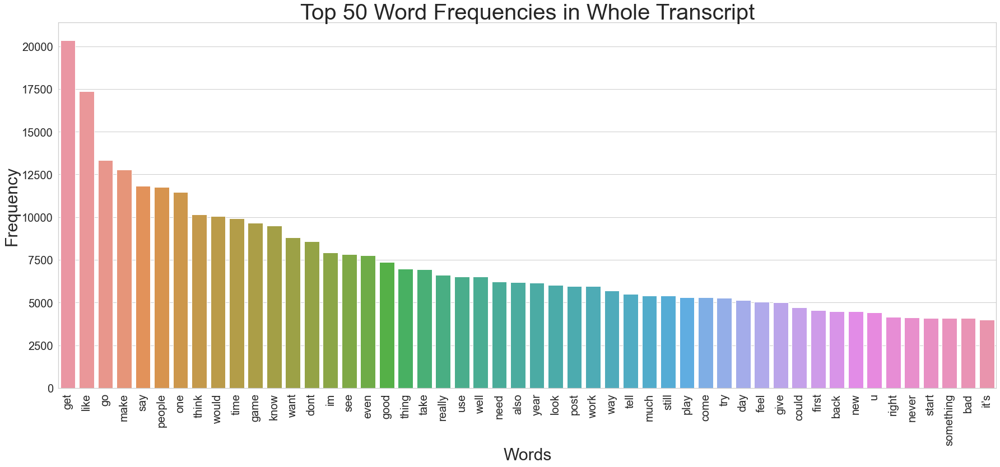

In [11]:
import seaborn as sns

plt.rcParams['figure.figsize'] = [30, 12]
sns.set_theme(style="whitegrid")
bp = sns.barplot(x="word", y="frequency", data=common_df)
bp.axes.set_title("Top 50 Word Frequencies in Whole Transcript",fontsize=40)
bp.set_xlabel("Words",fontsize=30)
bp.set_ylabel("Frequency",fontsize=30)
bp.tick_params(labelsize=20, axis='x', rotation=90)
bp.tick_params(labelsize=20, axis='y')
plt.show()

#### Document Term Matrix

In [52]:
# my_stop_words = ['like', 'just', 'https', 'com']
# stop_words = text.ENGLISH_STOP_WORDS.union(my_stop_words)
from sklearn.feature_extraction import text

stop_words = text.ENGLISH_STOP_WORDS
cvn = CountVectorizer(stop_words=stop_words)
data_cvn = cvn.fit_transform(corpus.full_transcript)
data_dtmm = pd.DataFrame(data_cvn.toarray(), columns=cvn.get_feature_names())
data_dtmm.index = corpus.subreddit

In [53]:
data_dtmm = data_dtmm.transpose()
data_dtmm.head()

subreddit,2007scape,3Dprinting,AmItheAsshole,AskMen,AskReddit,BestofRedditorUpdates,CasualUK,Cringetopia,CryptoCurrency,Damnthatsinteresting,DnD,EscapefromTarkov,Games,Genshin_Impact,GlobalOffensive,HolUp,Home,IdiotsInCars,Jokes,LivestreamFail,MadeMeSmile,MaliciousCompliance,MechanicalKeyboards,Minecraft,Music,NoStupidQuestions,OnePiece,Piracy,ProgrammerHumor,PublicFreakout,StarWars,Superstonk,ThatsInsane,Tinder,TooAfraidToAsk,TrueOffMyChest,Twitch,TwoXChromosomes,Unexpected,VALORANT,WTF,Wellthatsucks,WhitePeopleTwitter,anime,antiwork,apexlegends,aww,buildapc,discordapp,dndnext,dyinglight,euphoria,europe,explainlikeimfive,facepalm,ffxiv,formula1,funny,gaming,gifs,greentext,halo,instant_regret,interestingasfuck,leagueoflegends,lostarkgame,manga,memes,mildlyinfuriating,movies,nba,news,nextfuckinglevel,nfl,nottheonion,oddlyterrifying,olympics,ontario,pathofexile,pcgaming,pcmasterrace,personalfinance,pics,pokemon,politics,relationship_advice,science,soccer,sysadmin,technology,teenagers,television,therewasanattempt,tifu,todayilearned,unpopularopinion,videos,wallstreetbets,worldnews,wow
00,0,0,0,2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
000,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,14,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0
0000,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
000000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


#### Top 30 words mentioned in each subreddit

In [90]:
top_dict = {}
for c in data_dtmm.columns:
    top = data_dtmm[c].sort_values(ascending=False).head(30)
    top_dict[c] = list(zip(top.index, top.values))
first_three = list(top_dict.items())[:3]
for key, item in first_three:
    print("subreddit:", key)
    print(item, "\n")

subreddit: 2007scape
[('game', 179), ('make', 119), ('like', 106), ('people', 99), ('want', 78), ('dont', 77), ('content', 74), ('play', 72), ('remove', 68), ('think', 62), ('account', 56), ('jagex', 56), ('way', 50), ('new', 49), ('im', 47), ('player', 47), ('time', 47), ('use', 46), ('really', 46), ('good', 45), ('know', 43), ('need', 42), ('look', 42), ('opinion', 41), ('point', 41), ('say', 39), ('thing', 39), ('world', 37), ('day', 36), ('post', 35)] 

subreddit: 3Dprinting
[('print', 189), ('use', 118), ('printer', 107), ('like', 78), ('3d', 77), ('make', 70), ('bed', 55), ('think', 53), ('need', 53), ('look', 52), ('time', 49), ('dont', 49), ('im', 48), ('work', 48), ('problem', 48), ('post', 47), ('good', 46), ('layer', 46), ('thing', 46), ('filament', 44), ('design', 43), ('pla', 40), ('really', 39), ('say', 39), ('want', 38), ('issue', 36), ('know', 35), ('ive', 35), ('help', 34), ('model', 33)] 

subreddit: AmItheAsshole
[('say', 649), ('like', 499), ('tell', 456), ('want', 

In [91]:
for subreddit, top_words in first_three:
    print(subreddit)
    print(", ".join([word for word, count in top_words[0:14]]))
    print('----')

2007scape
game, make, like, people, want, dont, content, play, remove, think, account, jagex, way, new
----
3Dprinting
print, use, printer, like, 3d, make, bed, think, need, look, time, dont, im, work
----
AmItheAsshole
say, like, tell, want, make, aita, think, friend, ask, time, know, im, thing, dont
----


In [92]:
from collections import Counter

words = []
for subreddit in data_dtmm.columns:
    top = [word for (word, count) in top_dict[subreddit]]
    for t in top:
        words.append(t)
words[:20]

['game',
 'make',
 'like',
 'people',
 'want',
 'dont',
 'content',
 'play',
 'remove',
 'think',
 'account',
 'jagex',
 'way',
 'new',
 'im',
 'player',
 'time',
 'use',
 'really',
 'good']

#### Word Cloud for all subreddits

In [17]:
from wordcloud import WordCloud

wc = WordCloud(stopwords=stop_words, background_color='white', colormap="Dark2", max_font_size=150, random_state=42)

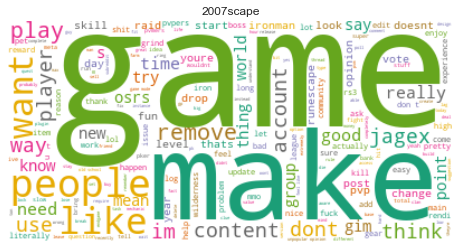

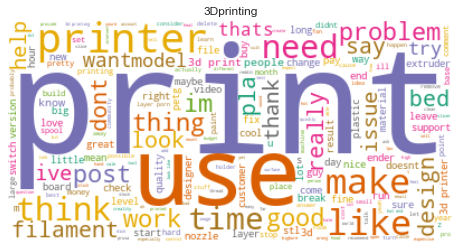

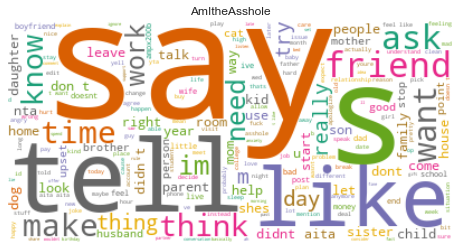

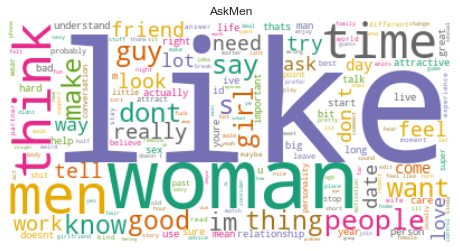

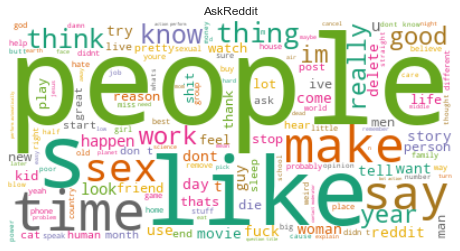

...

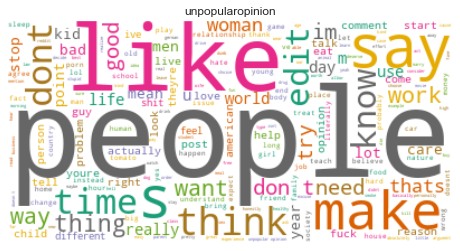

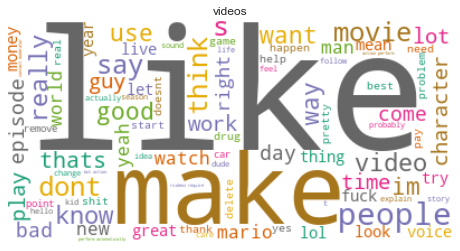

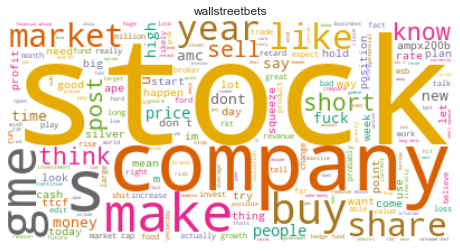

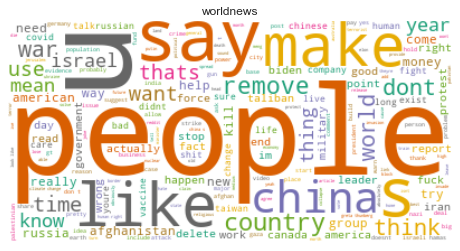

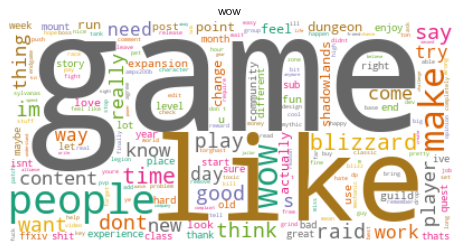

In [74]:
import matplotlib.pyplot as plt

# plt.rcParams['figure.figsize'] = [30, 12]

full_names = [subreddit for subreddit in data_dtmm.columns]

# Create subplots for each comedian
for index, subreddit in enumerate(data_dtmm.columns):
    wc.generate(corpus.at[submission_corpus['subreddit'].eq(subreddit).idxmax(), 'full_transcript'])
    plt.figure(figsize=(8,8))
#     plt.subplot(10, 10, index+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(full_names[index])
    plt.show()

### Insights:
Well, by visualizing the bar chart of top 50 most frequent words, we couldn't reveal any important insights within the corpus as these words doesn't tell us much about any of the subreddit themes even we've perform some basic text processing before the EDA steps. These words such as <b>'I', 'get', 'like', 'go'</b> which commonly used in every subreddit should be strip out in the preprocessing step.

However, we can observe from the word clouds that some of the choice of words that were favoured by different subreddits. Most obvious examples is subreddits like <b>2007scape, GlobalOffensive, Games, EscapefromTarkov, VALORANT, pokemon, pcgaming</b> etc. favours word like <b>'game'</b> which seem to resonate with themes that the subreddit was discussing about. Another thing to notice is there are still handful of words that seem to be quite out of place in some subreddits such as <b>'make', 'say', 'just'</b> which seem to appear commonly all over the corpus.

# Vocabulary

In [19]:
unique_list = []
for subreddit in data_dtmm.columns:
    uniques = data_dtmm[subreddit].to_numpy().nonzero()[0].size
    unique_list.append(uniques)

data_words = pd.DataFrame(list(zip(full_names, unique_list)), columns=['subreddit', 'unique_words'])
data_unique_sort = data_words.sort_values(by="unique_words", ascending=False)
data_unique_sort.head()

,subreddit,unique_words
5,BestofRedditorUpdates,10206
49,dndnext,5976
21,MaliciousCompliance,5599
93,tifu,5104
10,DnD,4887


#### Vocabulary Chart

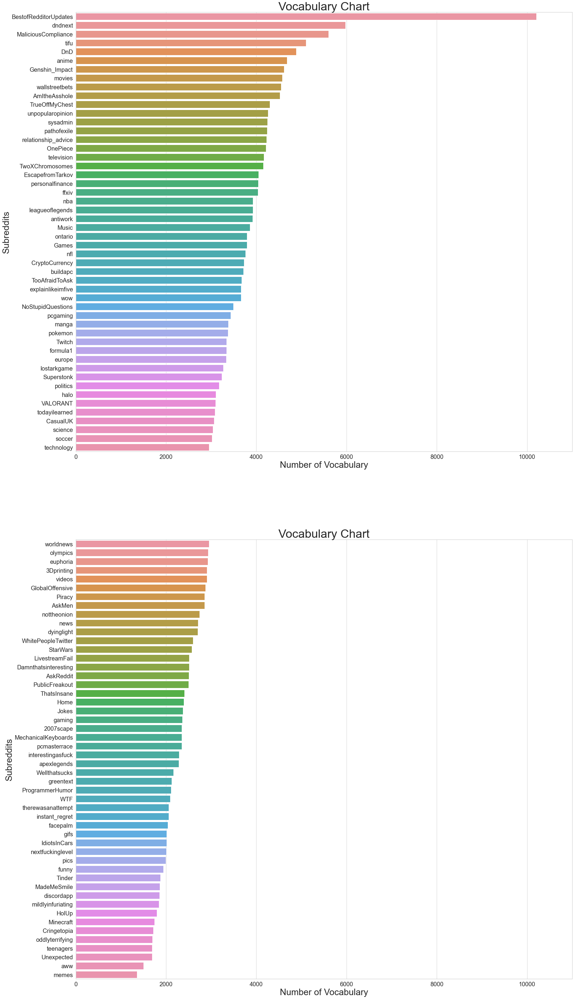

In [51]:
sns.set_theme(style="whitegrid")

# Initialize the matplotlib figure
f, ax = plt.subplots(2, 1, figsize=(30,60))
ax = ax.flatten()

unique_1 = data_unique_sort.iloc[:50]
unique_2 = data_unique_sort.iloc[50:]


sns.set_color_codes("muted")

bp = sns.barplot(x="unique_words", y="subreddit", data=unique_1, label="Vocabulary", ax=ax[0])
bp.axes.set_title("Vocabulary Chart", fontsize=40)
bp.set_xlabel("Number of Vocabulary", fontsize=30)
bp.set_ylabel("Subreddits", fontsize=30)
bp.set(xlim=(0, 11000))
bp.tick_params(labelsize=20)

bp = sns.barplot(x="unique_words", y="subreddit", data=unique_2, label="Vocabulary", ax=ax[1])
bp.axes.set_title("Vocabulary Chart", fontsize=40)
bp.set_xlabel("Number of Vocabulary", fontsize=30)
bp.set_ylabel("Subreddits", fontsize=30)
bp.set(xlim=(0, 11000))
bp.tick_params(labelsize=20)

#### BestofRedditorUpdates's Unique Words

In [95]:
res = Counter()
BRU = corpus[corpus.subreddit == "BestofRedditorUpdates"]
BRU['full_transcript'].apply(lambda x: res.update(x.split()))
sorted(res.items(), key=lambda pair: pair[1])[:20]

[('2disclaimer', 1),
 ('coupon', 1),
 ('revolve', 1),
 ('himthem', 1),
 ('leavescheats', 1),
 ('correction', 1),
 ('reliefor', 1),
 ('heshe', 1),
 ('reneg', 1),
 ('protects', 1),
 ('motivator', 1),
 ('overthinking', 1),
 ('chirp', 1),
 ('quirk', 1),
 ('sheltering', 1),
 ('cord', 1),
 ('rotate', 1),
 ('daddys', 1),
 ('gymnast', 1),
 ('workpleasure', 1)]

### Insights:
Clearly, memes and aww subreddits have the least vocabulary.

Notice anything odd about the chart that the <b>BestofRedditorUpdates</b> have a much larger vocabulary(around 4200 differences of unique words) compare to <b>dndnext</b> which appear to be the second largest vocabulary subreddit. Based on the title and content of the subreddit, there are chances that <b>BestofRedditorUpdates</b> revolve around range from a scope of many different themes. Therefore, we should consider to remove these unique word because they rarely offer anything interesting causing the association between them and other words to be dominated by noise.